 ## 11. Calculus Becomes Analysis

In [360]:
from spb import (
    PB,
    plot,
    plot_parametric,
    plot_polar,
    plot3d_implicit
)
from spb.defaults import cfg
from sympy import (
    Abs,
    cos,
    Derivative,
    Eq,
    Function,
    Idx,
    IndexedBase,
    Integral,
    Lambda,
    oo,
    pi,
    sin,
    sqrt,
    Sum,
    Symbol,
    symbols
)

cfg['matplotlib']['show_minor_grid'] = True

In [3]:
x = Symbol('x')
f = Function('f')

L2_norm = sqrt(Integral(Abs(f(x))**2))
L2_norm

sqrt(Integral(Abs(f(x))**2, x))

In [4]:
f_subs = x**2
norm_f = sqrt(Integral(Abs(f(x))**2, (x, 0, 1))).subs(f(x), f_subs)
norm_f.n()

0.447213595499958

In [5]:
g = Function('g')

g_subs = sin(x)
norm_g = sqrt(Integral(Abs(g(x))**2, (x, 0, 1))).subs(g(x), g_subs)
norm_g.n()

0.522183534108056

In [6]:
norm_fg = norm_f - norm_g
norm_fg

-sqrt(Integral(Abs(sin(x))**2, (x, 0, 1))) + sqrt(Integral(Abs(x**2)**2, (x, 0, 1)))

In [7]:
L2_distance = norm_fg.n()
L2_distance

-0.0749699386080983

In [8]:
L2_inner_prod = Integral(f(x)*g(x))
L2_inner_prod

Integral(f(x)*g(x), x)

In [9]:
Integral(f(x)*g(x), (x, 0, 1)).subs({f(x): f_subs, g(x): g_subs}).n()

0.223244275483933

In [10]:
c, t = symbols('c, t')

u = f(x - c*t)
u

f(-c*t + x)

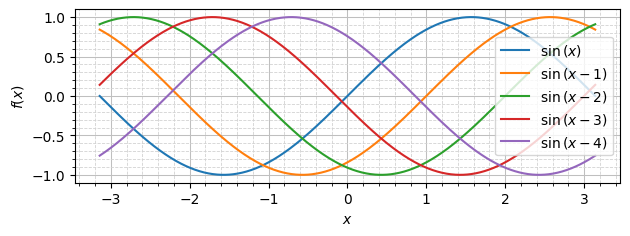

In [11]:
plot(
    *[u.replace(f, sin).subs({c: 1, t: time}) for time in range(0, 5)],
    (x, -pi, pi),
    aspect='equal'
)

In [12]:
first_order_pde = Eq(Derivative(u, t), -c * Derivative(u, x))
first_order_pde

Eq(Derivative(f(-c*t + x), t), -c*Derivative(f(-c*t + x), x))

In [59]:
first_order_pde.subs({f: sin, c: 1, t: 1, x: 1}).doit()

True

In [27]:
k = Function('k')
u_xt = Function('u')(x, t)

Eq(u_xt, k(x - c*t))

Eq(u(x, t), k(-c*t + x))

In [28]:
v = g(x + c*t)
v

g(c*t + x)

In [54]:
second_order_pde = Eq(Derivative(u, t, t), -c * Derivative(u, x, x))
second_order_pde

Eq(Derivative(f(-c*t + x), (t, 2)), -c*Derivative(f(-c*t + x), (x, 2)))

In [58]:
second_order_pde.subs({f: sin, c: 1, t: 1, x: 1}).doit()

True

In [36]:
wave_equation = u + v
wave_equation

f(-c*t + x) + g(c*t + x)

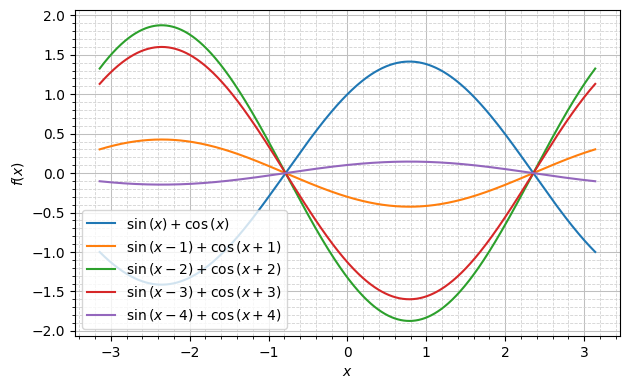

In [42]:
plot(
    *[wave_equation.subs({f: sin, g: cos, c: 1, t: tm}) for tm in range(0, 5)],
    (x, -pi, pi),
    aspect='equal'
)

In [75]:
y, z = symbols('y, z')

wave_equation_3d = Eq(
    Derivative(u, t, t),
    c**2 * (Derivative(u, x, x) + Derivative(u, y, y) + Derivative(u, z, z))
)
wave_equation_3d

Eq(Derivative(f(-c*t + x), (t, 2)), c**2*(Derivative(f(-c*t + x), (x, 2)) + Derivative(f(-c*t + x), (y, 2)) + Derivative(f(-c*t + x), (z, 2))))

In [76]:
wave_equation_3d.doit()

True

In [78]:
r = Symbol('r')

u_potential = 1 / r
u_potential

1/r

In [123]:
potential_fun = (x**2 + y**2 + z**2)**-(1/2)

Eq(u_potential, potential_fun)

Eq(1/r, (x**2 + y**2 + z**2)**(-0.5))

In [121]:
plot3d_implicit(
    potential_fun - 1,
    (x, -1, 1),
    (y, -1, 1),
    (z, -1, 1),
    backend=PB
)

In [148]:
potential_pde = (
    Derivative(potential_fun, x, x) +
    Derivative(potential_fun, y, y) +
    Derivative(potential_fun, z, z)
)

Eq(potential_pde, 0)

Eq(Derivative((x**2 + y**2 + z**2)**(-0.5), (x, 2)) + Derivative((x**2 + y**2 + z**2)**(-0.5), (y, 2)) + Derivative((x**2 + y**2 + z**2)**(-0.5), (z, 2)), 0)

In [149]:
Eq(potential_pde.subs({x: 1, y: 0, z: 0}), 0).doit()

True

In [150]:
Integral(potential_pde, x, y, z)

Integral(Derivative((x**2 + y**2 + z**2)**(-0.5), (x, 2)) + Derivative((x**2 + y**2 + z**2)**(-0.5), (y, 2)) + Derivative((x**2 + y**2 + z**2)**(-0.5), (z, 2)), x, y, z)

In [152]:
k = Symbol('k')

harmonic_pde = Eq(Derivative(x, t, t), -k**2 * x)
harmonic_pde

Eq(Derivative(x, (t, 2)), -k**2*x)

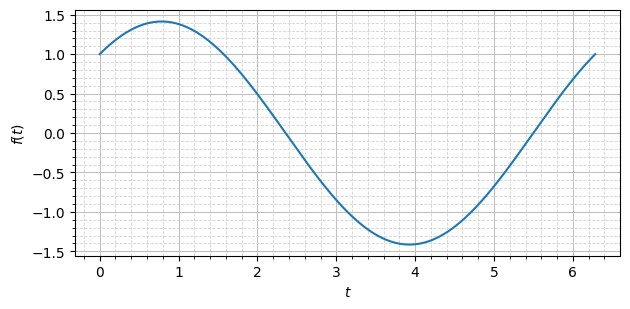

In [157]:
A, B = symbols('A, B')

harmonic_pde_solution = A * cos(k*t) + B * sin(k*t)

plot(
    harmonic_pde_solution.subs({A: 1, B: 1, k: 1}),
    (t, 0, 2*pi),
    aspect='equal'
)

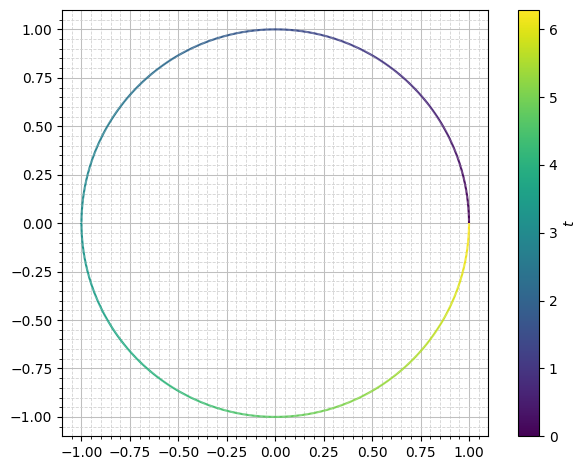

In [156]:
plot_parametric(
    cos(k*t).subs(k, 1),
    sin(k*t).subs(k, 1),
    (t, 0, 2*pi),
    aspect='equal'
)

In [171]:
a = IndexedBase('a')
b = IndexedBase('b')
ki = Idx('k')

f_x = 1/2 * a[0] + Sum(a[ki] * cos(ki*x) + b[ki] * sin(ki*x), (ki, 1, oo))
f_x

0.5*a[0] + Sum(sin(x*k)*b[k] + cos(x*k)*a[k], (k, 1, oo))

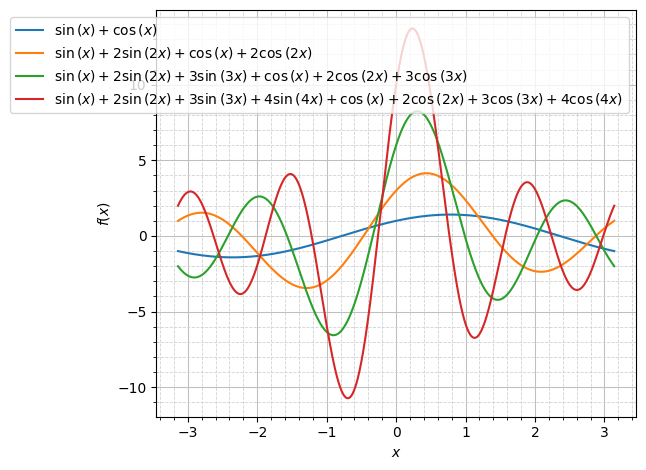

In [228]:
plot(
    *[f_x.subs({oo: i, a: range(i), b: range(i)}).doit() for i in range(1, 5)],
    (x, -pi, pi)
)

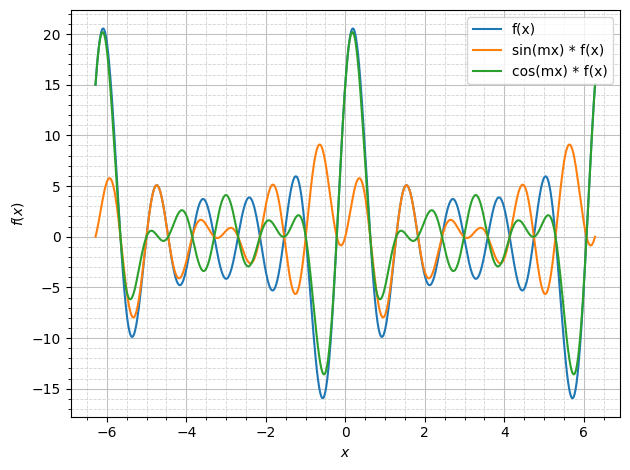

In [277]:
m = Symbol('m')
f_x_subs = {oo: 5, a: range(5), b: range(5)}

plot(
    (f_x.subs(f_x_subs).doit(), 'f(x)'),
    (sin(m*x).subs(m, 1) * f_x.subs(f_x_subs).doit(), 'sin(mx) * f(x)'),
    (cos(m*x).subs(m, 1) * f_x.subs(f_x_subs).doit(), 'cos(mx) * f(x)'),
    (x, 2*-pi, 2*pi)
)

In [280]:
Integral(sin(m*x) * f_x.subs(f_x_subs), (x, 0, 2*pi)).subs(m, 1).doit()

pi

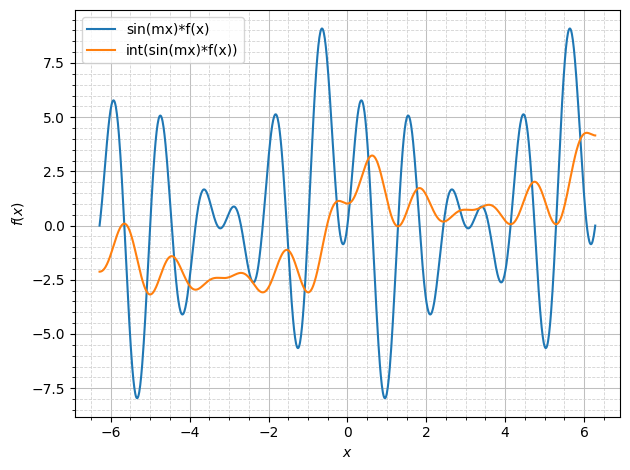

In [309]:
plot(
    ((sin(m*x).subs(m, 1) * f_x).subs(f_x_subs).doit(), 'sin(mx)*f(x)'),
    (
        Integral(sin(m*x).subs(m, 1) * f_x.subs(f_x_subs)).doit(),
        'int(sin(mx)*f(x))'
    ),
    (x, 2*-pi, 2*pi)
)

In [281]:
Integral(cos(m*x) * f_x.subs(f_x_subs), (x, 0, 2*pi)).subs(m, 1).doit()

pi

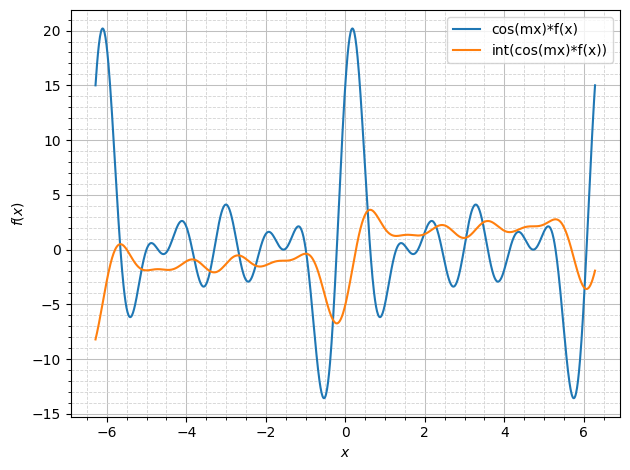

In [311]:
plot(
    (cos(m*x).subs(m, 1) * f_x.subs(f_x_subs).doit(), 'cos(mx)*f(x)'),
    (Integral(cos(m*x).subs(m, 1) * f_x.subs(f_x_subs)).doit(), 'int(cos(mx)*f(x))'),
    (x, 2*-pi, 2*pi)
)

In [271]:
a_m = 1/pi * Integral(f(x) * cos(m*x), (x, 0, 2*pi))
a_m

Integral(f(x)*cos(x), (x, 0, 2*pi))/pi

In [319]:
a_m.replace(f(x), f_x).subs(f_x_subs_m).doit()

1

In [320]:
b_m = 1/pi * Integral(f(x) * sin(m*x), (x, 0, 2*pi))
b_m

Integral(f(x)*sin(m*x), (x, 0, 2*pi))/pi

In [331]:
b_m.replace(f(x), f_x).subs(f_x_subs_m).doit()

1

In [333]:
theta = Symbol('θ')
f_theta = f_x.replace(x, theta)
f_theta

0.5*a[0] + Sum(sin(θ*k)*b[k] + cos(θ*k)*a[k], (k, 1, oo))

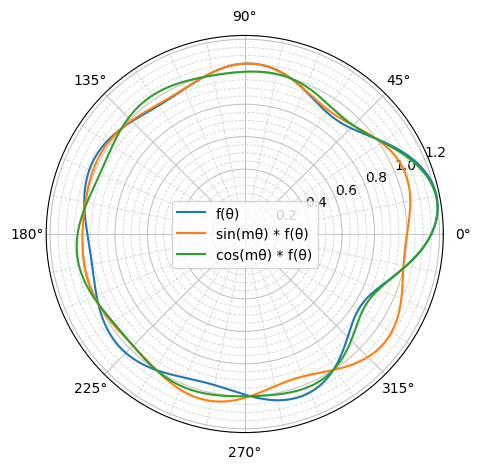

In [354]:
plot_polar(
    (1 + (f_theta.subs(f_x_subs).doit() / 100), 'f(θ)'),
    (
        1 + (sin(m*theta).subs(m, 1) * f_theta.subs(f_x_subs).doit()/100),
        'sin(mθ) * f(θ)'
    ),
    (
        1 + (cos(m*theta).subs(m, 1) * f_theta.subs(f_x_subs).doit()/100),
        'cos(mθ) * f(θ)'
    ),
    (theta, 0, 2*pi),
    polar_axis=True
)

In [361]:
a, b, l, m, n = symbols('a, b, l, m, n')
F = Lambda((l, m, n), l + m + n)
y = f(x)

Integral(F(y, y.diff(x), x), (x, a, b))

Integral(x + f(x) + Derivative(f(x), x), (x, a, b))